In [1]:
import numpy as np
import cv2 

In [2]:
import keras

Using TensorFlow backend.


In [3]:
from __future__ import print_function
from keras import backend as K
import tensorflow as tf
mnist = tf.keras.datasets.mnist
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Conv2D, Dense, MaxPool2D, Flatten, BatchNormalization, Input, Dropout, concatenate

from tensorflow.keras.preprocessing.image import *

In [4]:
def inception_block(x, filters):
#     last = x

    net1 = Conv2D(filters = filters, kernel_size=(1,1), padding='Same', activation = 'relu')(x)

    net2 = Conv2D(filters = filters, kernel_size=(1,1), padding='Same', activation = 'relu')(x)
    net2 = Conv2D(filters = filters, kernel_size=(3,3), padding='Same', activation = 'relu')(net2)

    net3 = Conv2D(filters = filters, kernel_size=(1,1), padding='Same', activation = 'relu')(x)
    net3 = Conv2D(filters = filters, kernel_size=(3,3), padding='Same', activation = 'relu')(net3)
    net3 = Conv2D(filters = filters, kernel_size=(3,3), padding='Same', activation = 'relu')(net3)

    output = concatenate([net1, net2, net3], axis=3)
    return output

In [5]:
weight_dir = "../q1/q1_2_2/"

In [6]:
input_shape = (28,28,3)

input_layer = Input(shape=input_shape)
x = Conv2D(filters = 32, kernel_size=(5,5), padding='Same', activation = 'relu')(input_layer)
x = Conv2D(filters = 32, kernel_size=(5,5), padding='Same', activation = 'relu')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(5, 5), strides=(2,2))(x)

# last = x

x = inception_block(x,32)
x = MaxPool2D(pool_size=(5, 5), strides=(2,2),padding='Same')(x)

# x = MaxPool2D(pool_size=(3, 3), strides=(2,2))(x)
# x = inception_block(x,64)
# x = MaxPool2D(pool_size=(3, 3), strides=(1,1),padding='Same')(x)

x = inception_block(x,64)
x = MaxPool2D(pool_size=(3, 3), strides=(1,1),padding='Same')(x)

# x = concatenate([x, last], axis=3)
# x = Conv2D(filters = 128, kernel_size=(3,3), padding='Same', activation = 'relu')(x)
# x = Conv2D(filters = 128, kernel_size=(3,3), padding='Same', activation = 'relu')(x)
# x = MaxPool2D(pool_size=(3, 3), strides=(1,1))(x)

# x = Conv2D(filters = 128, kernel_size=(3,3), padding='Same', activation = 'relu')(x)
# x = Conv2D(filters = 128, kernel_size=(3,3), padding='Same', activation = 'relu')(x)
# x = MaxPool2D(pool_size=(3, 3), strides=(2,2),padding='Same')(x)

# x = Conv2D(filters = 256, kernel_size=(3,3), padding='Same', activation = 'relu')(x)
# x = Conv2D(filters = 256, kernel_size=(3,3), padding='Same', activation = 'relu')(x)
# x = MaxPool2D(pool_size=(3, 3), strides=(1,1),padding='Same')(x)

x = Flatten()(x)

# x = Dense(2048, activation=tf.nn.relu)(x)
# x = Dropout(0.5)(x)

x = Dense(1024, activation=tf.nn.relu)(x)
x = Dropout(0.5)(x)

# x = Dense(128, activation=tf.nn.relu)(x)
# x = Dropout(0.5)(x)

x = Dense(96, activation=tf.nn.softmax)(x)

from tensorflow.keras.models import Model


model = Model(input_layer, x)
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 28, 28, 3)    0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 28, 28, 32)   2432        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 28, 28, 32)   25632       conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization_v

In [7]:
weight_dir = "../q1/q1_2_2/line/"
model.load_weights(weight_dir + "line_2.h5")

In [8]:
img=np.load('test_line_3.npy')

In [9]:
layer_outputs = [layer.output for layer in model.layers[1:3]]
layer_outputs1 = [layer.output for layer in model.layers[5:11]]
layer_outputs2 = [layer.output for layer in model.layers[13:19]]


layer_outputs = layer_outputs+layer_outputs1+layer_outputs2

In [10]:
activation_model = Model(inputs=model.input, outputs=layer_outputs)

In [11]:
a = activation_model.predict(img)

In [12]:
a[1].shape


(6, 28, 28, 32)

In [13]:
len(a)
a[0].shape

(6, 28, 28, 32)

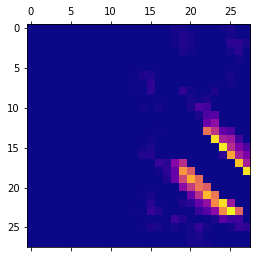

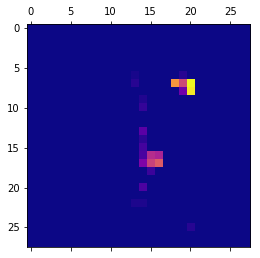

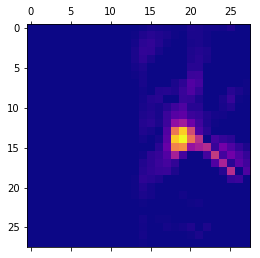

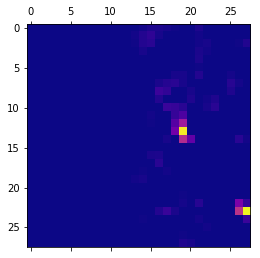

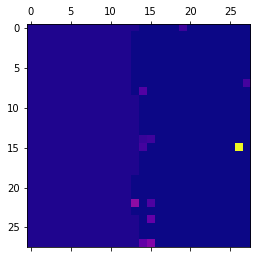

...

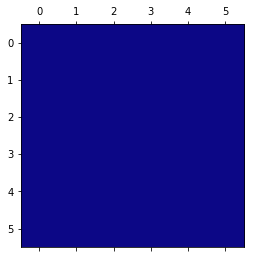

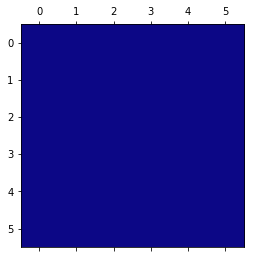

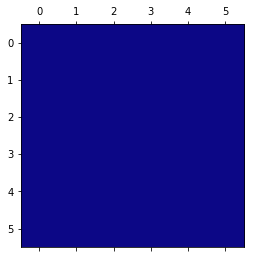

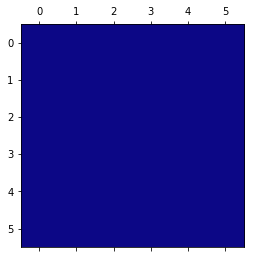

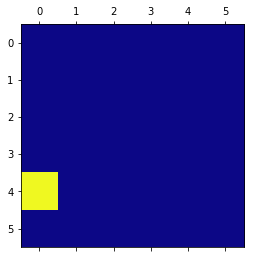

In [ ]:
di = "activations_line_2/"
for i in range(len(a)):
    for j in range(a[i].shape[0]):
        for k in range(a[i].shape[-1]):
            plt.matshow(a[i][j,:,:,k],cmap='plasma')
            plt.savefig(di+ str(j)+"_"+str(i)+"_"+str(k)+".png")
            plt.show()

In [ ]:
# weight , biases = model.get_layer('conv2d_1').get_weights()

In [ ]:
# weight.shape
